## Generative Adversarial Network

Generative Adversarial Networks a.k.a GANs, are popular generative neural networks. GANs have demonstrated their effectiveness in nearly every problem in computer vision. The GAN works by training a pair of networks, Generator and Discriminator, with competing loss terms. As an analogy, we can think of these networks as an art-forger and the other, an art-expert. In GAN literature the Generator is the art-forger and the Discriminator is the art-expert. The Generator is trained to produce fake images (forgeries) to deceive the art-expert (Discriminator). The Discriminator which receives both the real images and fake images tries to distinguish between them to identify the fake images. The Generator uses the feedback from the Discriminator to improve it generation. Both the models are trained simulataneously and are always in competition with each other. This competition between the Generator and Discriminator drives them to improve their respective models continuously. The  model converges when the Generator produces fake images that are indistinguishable from the real images.  <br>

In this setup, the Generator does not have access to the real images whereas the Discriminator has access to both the real and the generated fake images. 

Let us define Discriminator D that takes an image as input and produces a number **(0/1)** as output and a Generator G that takes random noise as input and outputs a fake image. In practice, G and D are trained alternately i.e., For a fixed generator G, the Discriminator D is trained to classify the training data as real (output a value close to 1) or fake(output a value close to 0). Subsequenty, we freeze the Discriminator and train the Generator G to produce an image (fake) that outputs a value close to 1 (real) when passed through the Discriminator D. Thus, if the Generator is perfectly trained then the Discriminator D will be maximally confused by the images generated by G and predict 0.5 for all the inputs. 

**It will be ideal to solve this assignemnet on a computer with a GPU**. The Coursera platform does not support a GPU. You may want to explore [Google Colab](https://www.youtube.com/watch?v=inN8seMm7UI&ab_channel=TensorFlow) or [Kaggle](https://www.kaggle.com/dansbecker/running-kaggle-kernels-with-a-gpu)

Along with submitting the Python notebook, save the notebook along with its output after executing all the cells as a .html file and submit the html file as well. 

In this assignment, we will implement a Generative Adversarial Network on MNIST data and generate images that resemble the digits from the MNIST dataset.

To implement a GAN, we basically require 5 components:

- Real Dataset (real distribution)
- Low dimensional random noise that is input to the Generator to produce fake images
- Generator that generates fake images
- Discriminator that acts as an expert to distinguish real and fake images.
- Training loop where the competition occurs and models better themselves.


Let us implement each of the parts and train the overall model:

In [1]:
## import packages
import torch
import random
import numpy as np
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as dset
import os
import numpy.testing as npt
#from torchsummary import summary

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

## Checks for the availability of GPU 
is_cuda = torch.cuda.is_available()
#is_cuda = False
if is_cuda:
    print("working on gpu!")
else:
    print("No gpu! only cpu ;)")
    
## The following random seeds are just for deterministic behaviour of the code and evaluation

##############################################################################
################### DO NOT MODIFY THE CODE BELOW #############################    
##############################################################################

random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
os.environ['PYTHONHASHSEED'] = '0'

############################################################################### 

working on gpu!


### Download Data and Setup DataLoader

In this step we work on preparing the data. We normalize the images to range [-1, +1] 

In [2]:
import torchvision
import torchvision.transforms as transforms
import os

root = './data/'
if not os.path.isdir(root):
    os.mkdir(root)

train_bs = 128

# Data transformation for the DataLoader - normalizes to between [-1,1]
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])

training_data = torchvision.datasets.MNIST(root, train=True, transform=transform,download=True)
train_loader = torch.utils.data.DataLoader(dataset=training_data, batch_size=train_bs, shuffle=True, drop_last=True)

### Noise Input for the Generator 

Let us define a function which takes (batchsize, dimension) as input and returns a random noise of requested dimensions. This noise tensor will be the input to the generator.

In [3]:
def noise(bs, dim):
    """Generate random Gaussian noise vectors N(0,I), with mean 0 and variance 1.
    
    Inputs:
    - bs: integer giving the batch size of noise to generate.
    - dim: integer giving the dimension of the Gaussain noise to generate.
    
    Returns:
    A PyTorch Tensor containing Gaussian noise with shape [bs, dim]
    """
    
    out = (torch.randn((bs, dim)))
    if is_cuda:
        out = out.cuda()
    return out

### Generator Architecture - 20 points

Define a Generator with the following architecture. 

- Linear layer (noise_dim -> 256)
- LeakyReLU (works well for the Generators, we will use negative_slope=2)
- Linear Layer (256 -> 512)
- LeakyReLU
- Linear Layer (512 -> 1024)
- LeakyReLU
- Linear Layer (1024 -> 784) (784 is the MNIST image size 28*28)
- TanH (To scale the generated images to [-1,1], the same as real images)

- LeakyRELU: https://pytorch.org/docs/stable/nn.html#leakyrelu 
- Fully connected layer: https://pytorch.org/docs/stable/nn.html#linear 
- TanH activation: https://pytorch.org/docs/stable/nn.html#tanh

In [4]:
class Generator(nn.Module):
    def __init__(self, noise_dim=100, out_size=784):
        super(Generator, self).__init__()
        
        '''
        REST OF THE MODEL HERE
        
        # define a fully connected layer (self.layer1) from noise_dim -> 256 neurons      
        # define a leaky relu layer(self.leaky_relu) with negative slope=0.2. We can reuse the same layer multiple times.
        # define a fully connected layer (self.layer2) from 256 -> 512 neurons
        # define a fully connected layer (self.layer3) from 512 -> 1024 neurons
        # define a fully connected layer (self.layer4) from 1024 -> out_size neurons
        # define a tanh activation function (self.tanh)
        
        '''
        # your code here
        self.layer1 = nn.Linear(noise_dim, 256)
        self.leaky_relu = nn.LeakyReLU(0.2, inplace=False)
        self.layer2 = nn.Linear(256, 512)
        self.layer3 = nn.Linear(512, 1024)
        self.layer4 = nn.Linear(1024, out_size)
        self.tanh = nn.Tanh()
        
    def forward(self, x):
        '''
        Make a forward pass of the input through the generator. Leaky relu is used as the activation 
        function in all the intermediate layers. Tanh activation function is only used at the end (which
        is after self.layer4)
        
        Note that, generator takes an random noise as input and gives out fake "images". Hence, the Tensor 
        output after tanh activation function should be reshaped into the same size as the real images. i.e., 
        [batch_size, n_channels, H, W] == (batch_size, 1,28,28). You may use the .view(.) function to acheive it.
         
        '''
        # your code here
        batch_size = x.shape[0]
        #print(batch_size)
        x = self.layer1(x)
        x = self.leaky_relu(x)
        x = self.layer2(x)
        x = self.leaky_relu(x)
        x = self.layer3(x)
        x = self.leaky_relu(x)
        x = self.layer4(x)
        x = self.tanh(x)
        
        return x.view(batch_size,1,28,28)
             

In [5]:
# Initialize the Generator and move it to GPU (if is_cuda)
generator = Generator()
print(generator)
# If you have a system with a GPU, you may want to install torchsummary and display the network in more detail 
# summary(generator,(100,), device='cpu')

# move to GPU
if is_cuda:
    generator = generator.cuda()

Generator(
  (layer1): Linear(in_features=100, out_features=256, bias=True)
  (leaky_relu): LeakyReLU(negative_slope=0.2)
  (layer2): Linear(in_features=256, out_features=512, bias=True)
  (layer3): Linear(in_features=512, out_features=1024, bias=True)
  (layer4): Linear(in_features=1024, out_features=784, bias=True)
  (tanh): Tanh()
)


In [6]:
# Test cases
# Note the testcases only tests for input and output dimensions and range of values. 
# You may modify the architecture within those constraints
# noise_dim is always 100
# Input to generator is (B,noise_dim) where B is arbitray batch_size
# Output of the Generator is (B,1,28,28) where B is arbitray batch_size, 1 is the grayscale channel 28 is image size 
# The Generator Output is between [-1,1] since we use tanh() activations. 
# Input to Discriminator is (B,1,28,28), where B is arbitray batch_size, 1 is the grayscale channel 28 is image size
# output of the discriminator is Tensor of dimension (B,1) where B is arbitray batch_size 

a = torch.ones(5,100)
if is_cuda:
    a = a.cuda()
out = generator(a)
npt.assert_equal(out.shape, (5,1,28,28))
assert np.max(out.detach().cpu().numpy()) <= 1
assert np.min(out.detach().cpu().numpy()) >= -1

# Hidden test cases follow

### Discriminator Architecture - 20 points

Define a Discriminator with the following architecture. 

- Linear Layer (input_size -> 512)
- LeakyReLU with negative slope = 0.2
- Linear Layer (512 -> 256)
- LeakyReLU with negative slope = 0.2
- Linear Layer (256 -> 1)

In [7]:
## Similar to the Generator, we now define a Discriminator which takes in a vector and output a single scalar 
## value. 

class Discriminator(nn.Module):
    def __init__(self, input_size=784):
        super(Discriminator, self).__init__()
        '''
        REST OF THE MODEL HERE
        
        # define a fully connected layer (self.layer1) from input_size -> 512 neurons   
        # define a leaky relu layer(self.leaky_relu) with negative slope=0.2. (we will reuse the same layer)
        # define a fully connected layer (self.layer2) from 512 -> 256 neurons
        # define a fully connected layer (self.layer3) from 256 -> 1 neurons
        '''
        # your code here
        self.layer1 = nn.Linear(input_size, 512)
        self.leaky_relu = nn.LeakyReLU(0.2, inplace=False)
        self.layer2 = nn.Linear(512, 256)
        self.layer3 = nn.Linear(256, 1)
        
    
    def forward(self, x):
        '''
        The Discriminator takes a vectorized input of the real and generated fake images. Reshape the input 
        to match the Discriminator architecture. 
        
        Make a forward pass of the input through the Discriminator and return the scalar output of the 
        Discriminator.
        '''
        # your code here
        #print(x)
        flattened_x = x.view(x.size(0), -1)
        #rint(flattened_x)
        x = self.layer1(flattened_x)
        x = self.leaky_relu(x)
        x = self.layer2(x)
        x = self.leaky_relu(x)
        x = self.layer3(x)
        
        return x      
        

In [8]:
# Initialize the Discriminator and move it to GPU (if is_cuda)
discriminator = Discriminator()

print(discriminator)
# If you have a system with a GPU, you may want to install torchsummary and display the network in more detail 
# summary(discriminator,(784,), device='cpu')

# move to GPU
if is_cuda:
    discriminator = discriminator.cuda()

Discriminator(
  (layer1): Linear(in_features=784, out_features=512, bias=True)
  (leaky_relu): LeakyReLU(negative_slope=0.2)
  (layer2): Linear(in_features=512, out_features=256, bias=True)
  (layer3): Linear(in_features=256, out_features=1, bias=True)
)


In [9]:
# Test cases
# Note the testcases only tests for input and output dimensions and range of values. 
# You may modify the architecture within those constraints
# noise_dim is always 100
# Input to generator is (B,noise_dim) where B is arbitray batch_size
# Output of the Generator is (B,1,28,28) where B is arbitray batch_size, 1 is the grayscale channel 28 is image size 
# The Generator Output is between [-1,1] since we use tanh() activations. 
# Input to Discriminator is (B,1,28,28), where B is arbitray batch_size, 1 is the grayscale channel 28 is image size
# output of the discriminator is Tensor of dimension (B,1) where B is arbitray batch_size 

a = torch.ones(5,1,28,28)
if is_cuda:
    a = a.cuda()
out = discriminator(a)
npt.assert_equal(out.shape, (5,1))

# Hidden testcases follow

### Binary Cross Entropy Loss 

We will use the Binary cross entropy loss function to train the GAN. The loss function includes sigmoid activation followed by logistic loss. This allows us to distinguish between real and fake images.

Binary cross entropy loss with logits: https://pytorch.org/docs/stable/nn.html#bcewithlogitsloss

In [10]:
# Initialize the 'BCEWithLogitsLoss' object
bce_loss = nn.BCEWithLogitsLoss()

### Discriminator Loss  - 10 points

Let's define the objective function for the Discriminator. It takes as input the logits (outputs of the Discriminator) and the labels (real or fake). It uses the BCEWithLogitsLoss() to compute the loss in classification.

In [11]:
def DLoss(logits_real, logits_fake, targets_real, targets_fake):
    '''
    Returns the Binary Cross Entropy Loss between predictions and targets
    
    Inputs:
        logits_real: the outputs of the discriminator (before the sigmoid) for real images
        logits_fake: the outputs of the discriminator (before the sigmoid) for fake images
        targets_real: groundtruth labels for real images
        targets_fake: groundtruth labels for fake images
    
    '''
    # Concatenate the logits_real and the logits_fake using torch.cat() to get 'logits'
    # Concatenate the targets_real and the targets_fake using torch.cat() to get 'targets'
    # estimate the loss using the BCEWithLogitsLoss object 'bce' with 'logits' and 'targets'
    # your code here
    logits = torch.cat((logits_real, logits_fake), 1)
    targets = torch.cat((targets_real, targets_fake), 1)
    loss = bce_loss(logits, targets)
    
    return loss

In [12]:
# Hidden testcases follow

### Generator Loss  - 10 points

Let's define the objective function for the Generator. It takes as input the logits (outputs of the Discriminator) for the fake images it has generated and the labels (real). It uses the BCEWithLogitsLoss() to compute the loss in classification. 
The Generator expects the logits for the fake images it has generated to be close to 1 (real). If that is not the case, the Generatro corrects itself with the loss

In [13]:
def GLoss(logits_fake, targets_real):
    '''
    The aim of the Generator is to fool the Discriminator into "thinking" the generated images are real.
    GLoss is the binary cross entropy loss between the outputs of the Discriminator with the 
    generated fake images 'logits_fake' and real targets 'targets_real'
    
    Inputs: 
        logits_fake: Logits from the Discriminator for the fake images generated by the Generator
        targets_real: groundtruth labels (close to 1) for the logits_fake
    '''
    # estimate the g_loss using the BCEWithLogitsLoss object 'bce' with 'logits_fake' and 'targets_real'
    # your code here
    g_loss = bce_loss(logits_fake, targets_real)
    #print(g_loss)
    return g_loss

In [14]:
# Hidden testcases follow

### GAN Training - 40 points

Optimizers for training the Generator and the Discriminator. The below setup generates good images with the architecture. 
Feel free to adjust the optimizer settings. 

Adam optimizer: https://pytorch.org/docs/stable/optim.html#torch.optim.Adam

In [15]:
#The following settings generated realistic images. Feel free to adjust the settings.
epochs = 201
noise_dim = 100
LR = 0.0002
optimizer_G = torch.optim.Adam(generator.parameters(), lr=LR, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=LR, betas=(0.5, 0.999))

Epoch:   0
D Loss:  0.5051980018615723
G Loss:  1.3295308351516724


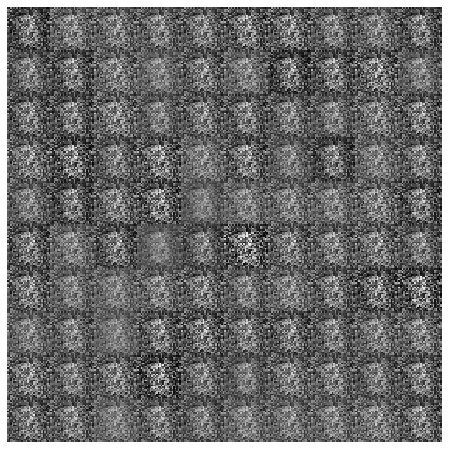

Epoch:   1
D Loss:  0.5223638415336609
G Loss:  1.6997873783111572
Epoch:   2
D Loss:  0.5240857601165771
G Loss:  1.2812273502349854


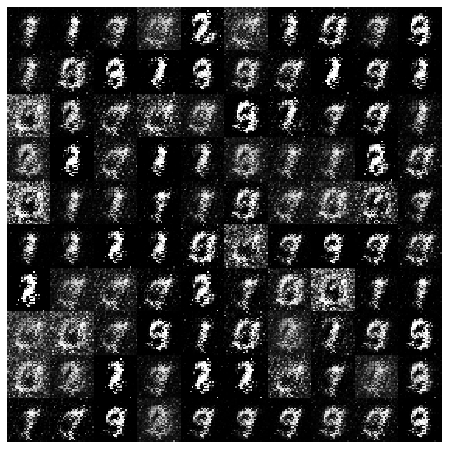

Epoch:   3
D Loss:  0.4446626901626587
G Loss:  1.239725112915039
Epoch:   4
D Loss:  0.48138612508773804
G Loss:  1.8343961238861084


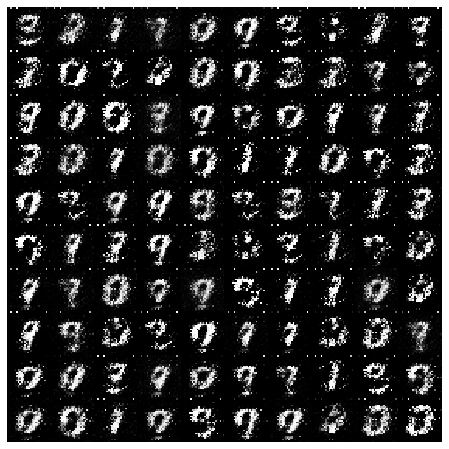

Epoch:   5
D Loss:  0.4354597330093384
G Loss:  1.7384991645812988
Epoch:   6
D Loss:  0.830906331539154
G Loss:  0.5925291776657104


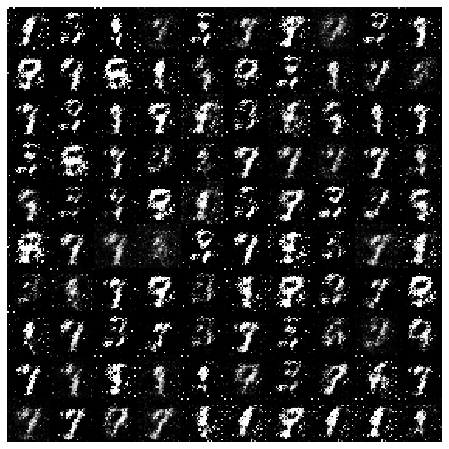

Epoch:   7
D Loss:  0.5481181144714355
G Loss:  2.1882338523864746
Epoch:   8
D Loss:  0.4871511459350586
G Loss:  1.3572818040847778


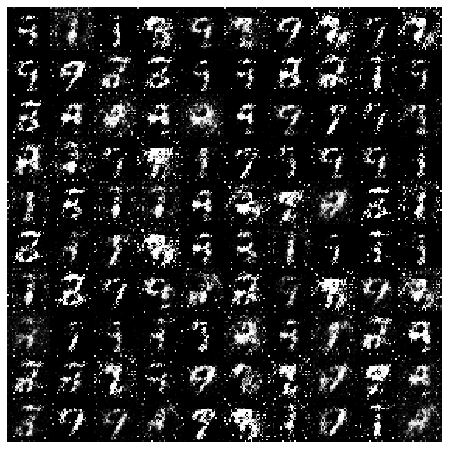

Epoch:   9
D Loss:  0.49585846066474915
G Loss:  1.8230206966400146
Epoch:   10
D Loss:  0.5350050330162048
G Loss:  1.2163045406341553


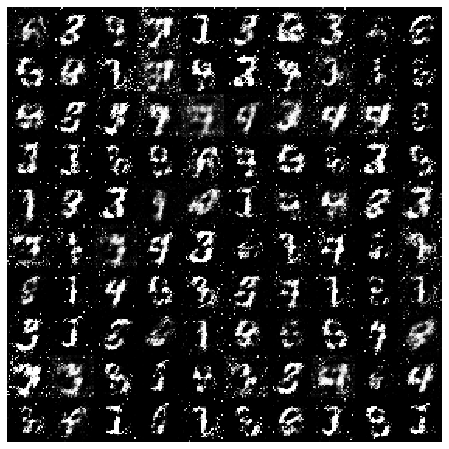

Epoch:   11
D Loss:  0.5312985181808472
G Loss:  1.7681748867034912
Epoch:   12
D Loss:  0.5376377105712891
G Loss:  0.7909590601921082


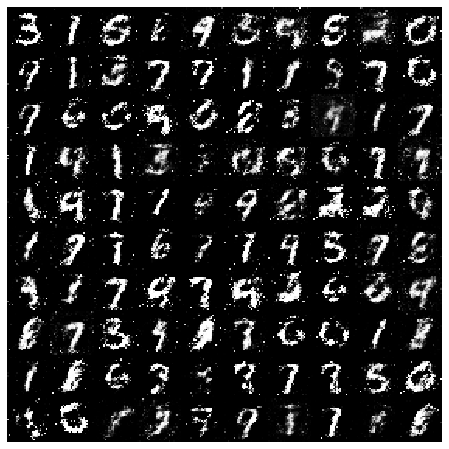

Epoch:   13
D Loss:  0.6313571929931641
G Loss:  0.5967822074890137
Epoch:   14
D Loss:  0.6028768420219421
G Loss:  0.8809777498245239


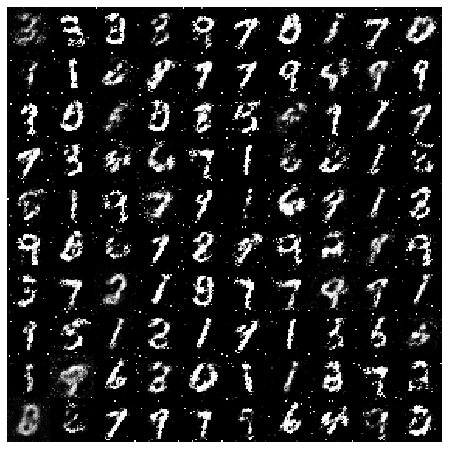

Epoch:   15
D Loss:  0.5858561396598816
G Loss:  0.9393405914306641
Epoch:   16
D Loss:  0.6011812090873718
G Loss:  0.851865291595459


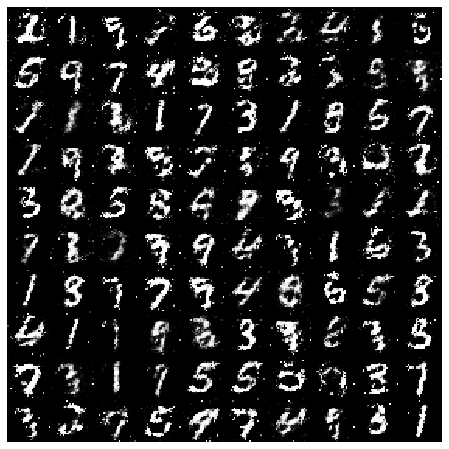

Epoch:   17
D Loss:  0.6084713935852051
G Loss:  0.6761000156402588
Epoch:   18
D Loss:  0.6110621094703674
G Loss:  0.9263758063316345


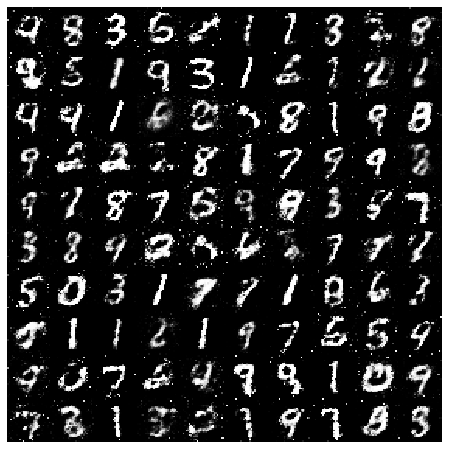

Epoch:   19
D Loss:  0.5958732962608337
G Loss:  0.8512648940086365
Epoch:   20
D Loss:  0.6094739437103271
G Loss:  0.9877051711082458


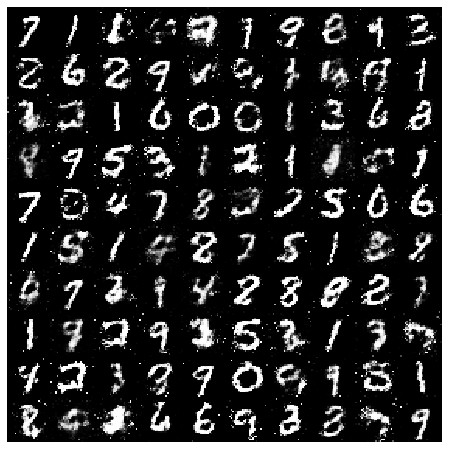

Epoch:   21
D Loss:  0.6144082546234131
G Loss:  0.7865720987319946
Epoch:   22
D Loss:  0.7167820334434509
G Loss:  1.451080083847046


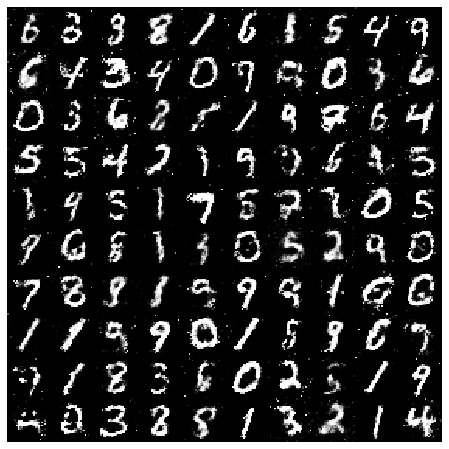

Epoch:   23
D Loss:  0.6447203755378723
G Loss:  0.8269942998886108
Epoch:   24
D Loss:  0.6090567111968994
G Loss:  0.9132982492446899


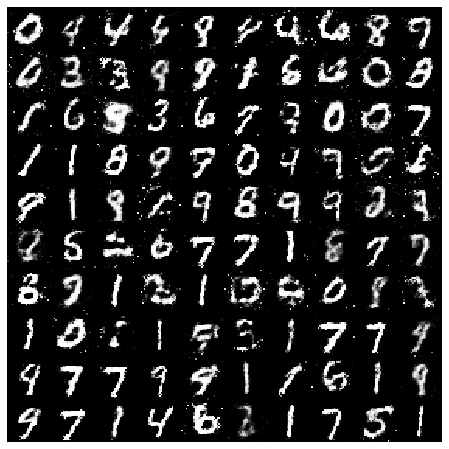

Epoch:   25
D Loss:  0.6300288438796997
G Loss:  1.0084335803985596
Epoch:   26
D Loss:  0.6156529188156128
G Loss:  1.0636022090911865


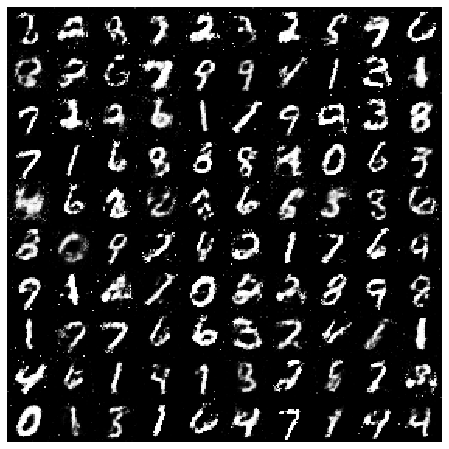

Epoch:   27
D Loss:  0.6170777082443237
G Loss:  0.8527587056159973
Epoch:   28
D Loss:  0.6448285579681396
G Loss:  0.7033337354660034


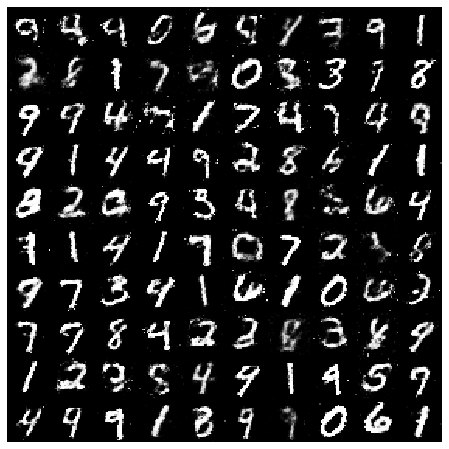

Epoch:   29
D Loss:  0.6341230869293213
G Loss:  0.6935844421386719
Epoch:   30
D Loss:  0.6546300649642944
G Loss:  1.1658685207366943


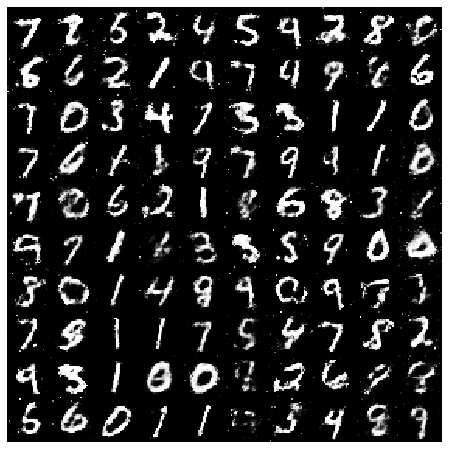

Epoch:   31
D Loss:  0.6397474408149719
G Loss:  0.7071958780288696
Epoch:   32
D Loss:  0.6304116249084473
G Loss:  0.7561469078063965


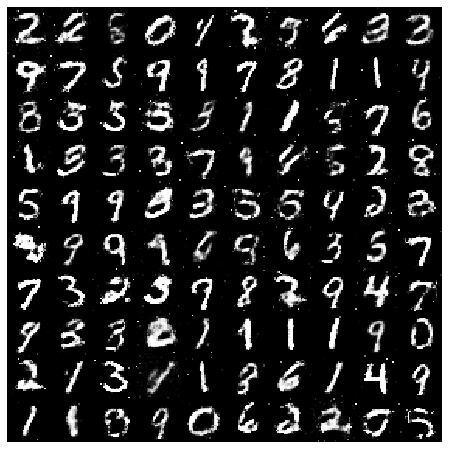

Epoch:   33
D Loss:  0.6490418910980225
G Loss:  0.7232348918914795
Epoch:   34
D Loss:  0.6117326021194458
G Loss:  0.8593748807907104


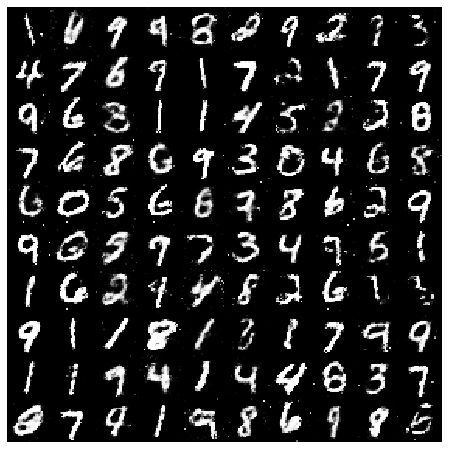

Epoch:   35
D Loss:  0.627113938331604
G Loss:  0.832451581954956
Epoch:   36
D Loss:  0.6249043941497803
G Loss:  0.8722195625305176


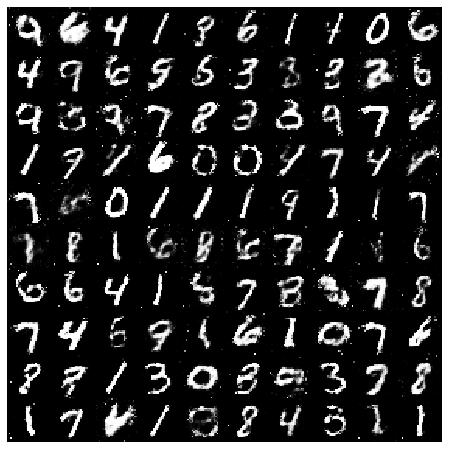

Epoch:   37
D Loss:  0.6135878562927246
G Loss:  0.8971316814422607
Epoch:   38
D Loss:  0.6212599277496338
G Loss:  0.802964985370636


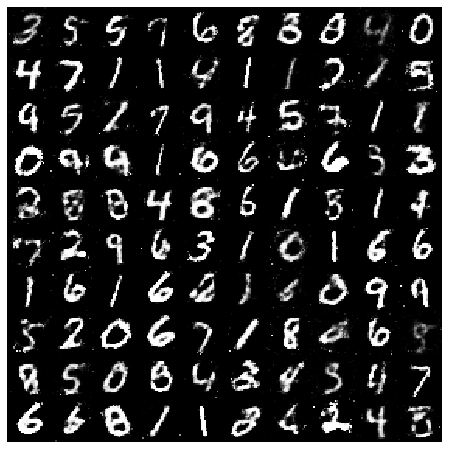

Epoch:   39
D Loss:  0.666510283946991
G Loss:  1.1046321392059326
Epoch:   40
D Loss:  0.6289737224578857
G Loss:  0.9111028909683228


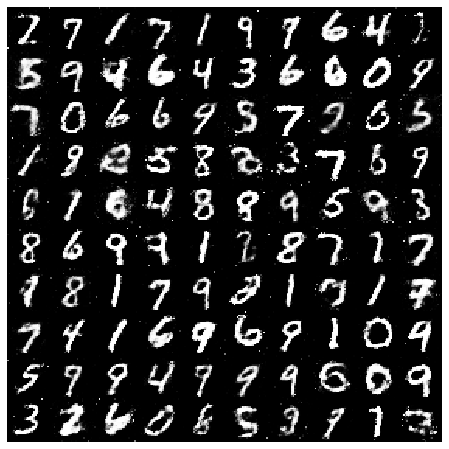

Epoch:   41
D Loss:  0.6395857334136963
G Loss:  0.6573754549026489
Epoch:   42
D Loss:  0.5990892052650452
G Loss:  0.8444935083389282


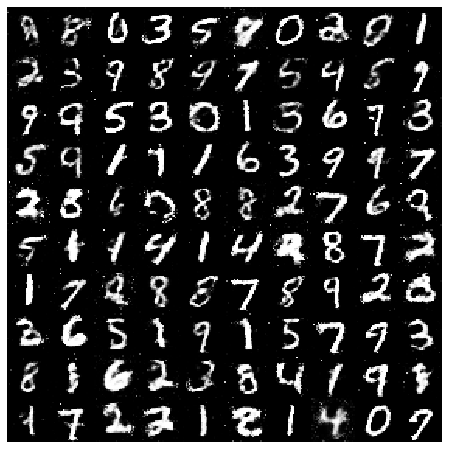

Epoch:   43
D Loss:  0.6156268119812012
G Loss:  0.9409309029579163
Epoch:   44
D Loss:  0.6164678335189819
G Loss:  0.9894636869430542


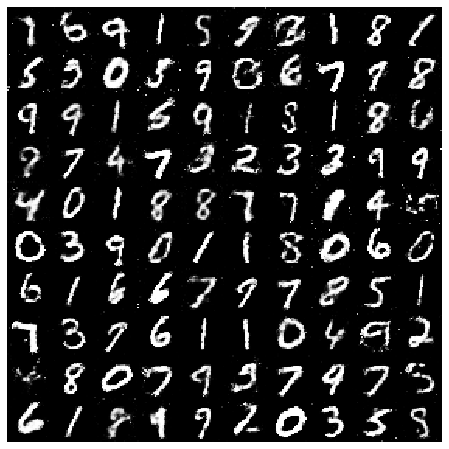

Epoch:   45
D Loss:  0.6313902139663696
G Loss:  1.0113893747329712
Epoch:   46
D Loss:  0.6291086673736572
G Loss:  1.1008989810943604


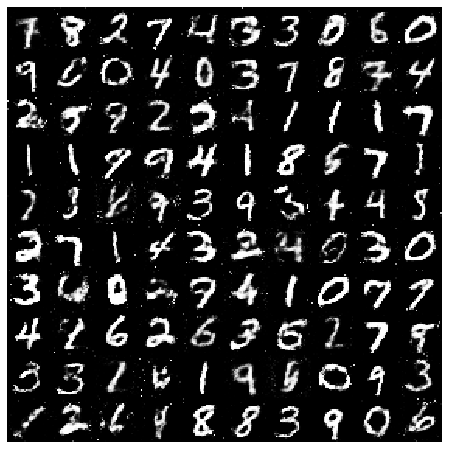

Epoch:   47
D Loss:  0.6016132235527039
G Loss:  0.9262328147888184
Epoch:   48
D Loss:  0.6036384105682373
G Loss:  0.7992024421691895


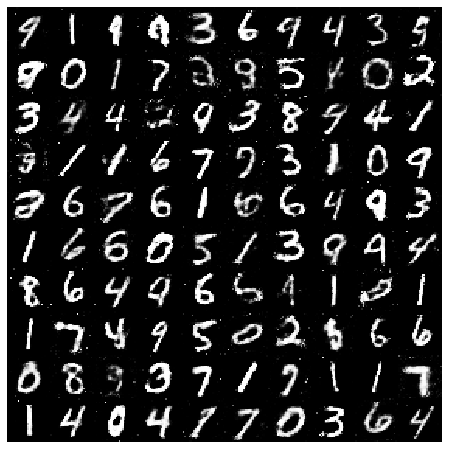

Epoch:   49
D Loss:  0.6229396462440491
G Loss:  1.0268341302871704
Epoch:   50
D Loss:  0.6266891956329346
G Loss:  0.8820788860321045


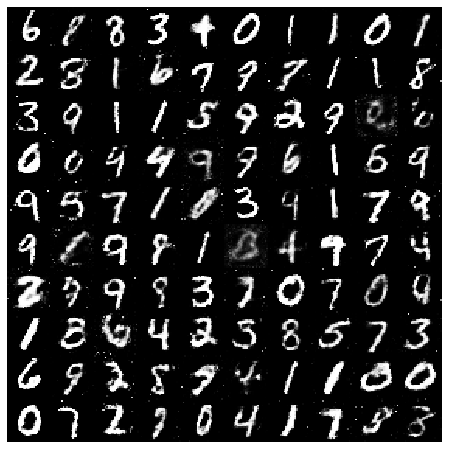

Epoch:   51
D Loss:  0.6080034971237183
G Loss:  0.9228026866912842
Epoch:   52
D Loss:  0.6121141910552979
G Loss:  0.8949319124221802


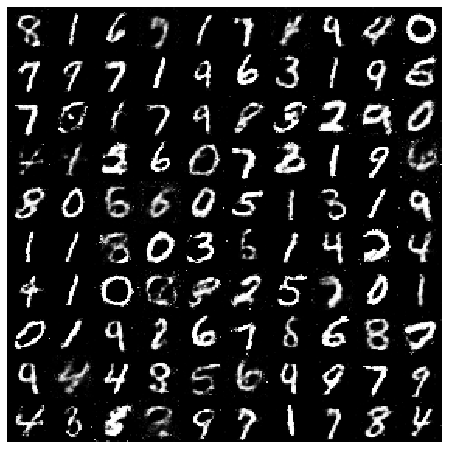

Epoch:   53
D Loss:  0.630435585975647
G Loss:  0.8763270378112793
Epoch:   54
D Loss:  0.6240648031234741
G Loss:  0.8463003635406494


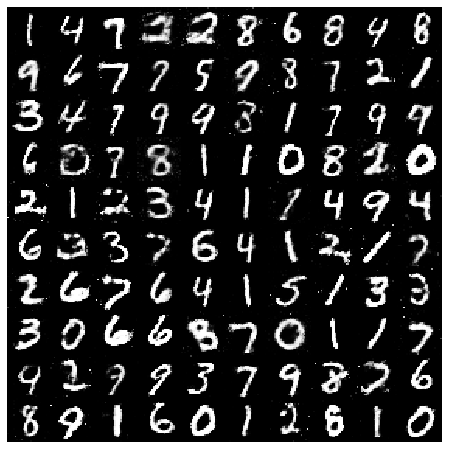

Epoch:   55
D Loss:  0.6476355791091919
G Loss:  0.9192538261413574
Epoch:   56
D Loss:  0.647079348564148
G Loss:  0.7411335706710815


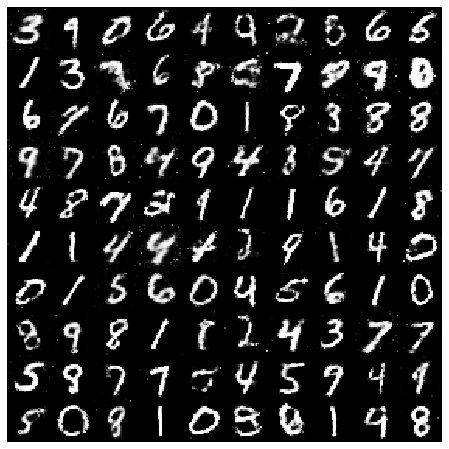

Epoch:   57
D Loss:  0.6249092221260071
G Loss:  1.1290736198425293
Epoch:   58
D Loss:  0.5990143418312073
G Loss:  1.0283820629119873


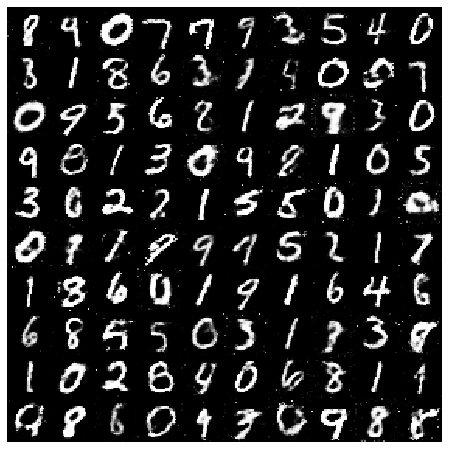

Epoch:   59
D Loss:  0.5914382934570312
G Loss:  0.9386840462684631
Epoch:   60
D Loss:  0.6071585416793823
G Loss:  0.8261090517044067


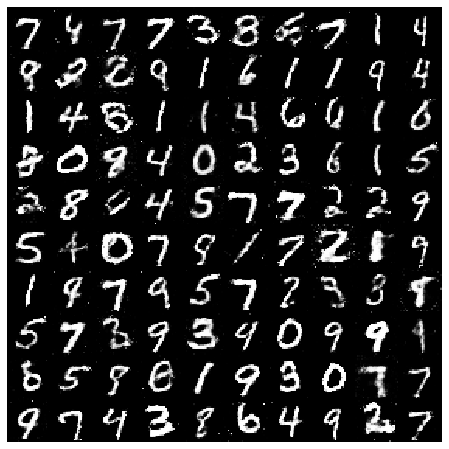

Epoch:   61
D Loss:  0.5987899303436279
G Loss:  0.8308621644973755
Epoch:   62
D Loss:  0.6128689050674438
G Loss:  0.887728214263916


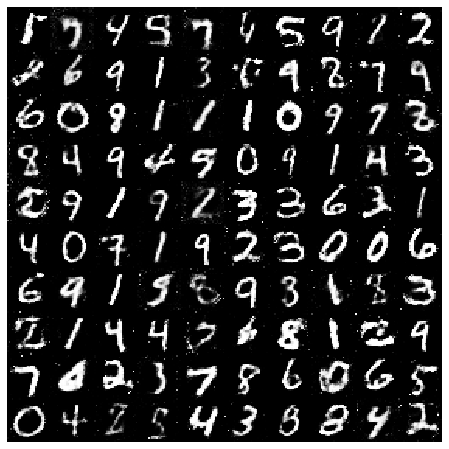

Epoch:   63
D Loss:  0.6077733635902405
G Loss:  0.8780944347381592
Epoch:   64
D Loss:  0.614363431930542
G Loss:  1.2124733924865723


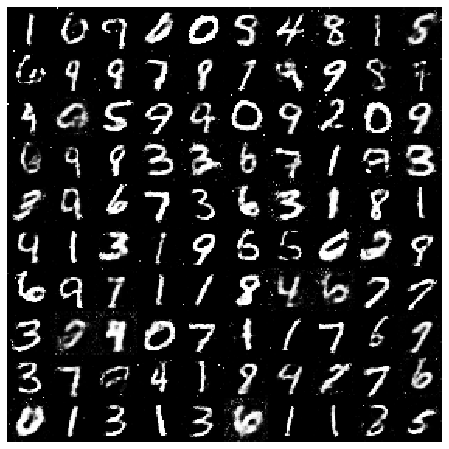

Epoch:   65
D Loss:  0.5989925861358643
G Loss:  0.9313281774520874
Epoch:   66
D Loss:  0.6117347478866577
G Loss:  0.924645185470581


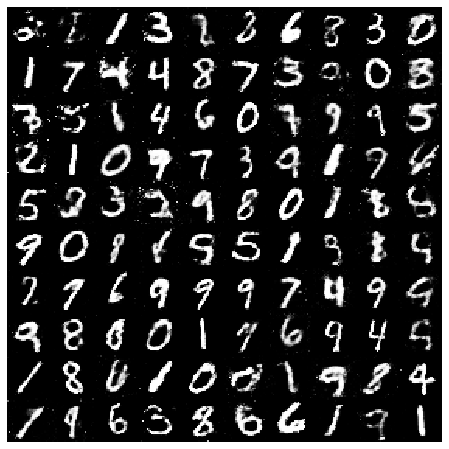

Epoch:   67
D Loss:  0.6527562141418457
G Loss:  0.5629476308822632
Epoch:   68
D Loss:  0.610690712928772
G Loss:  0.9585222601890564


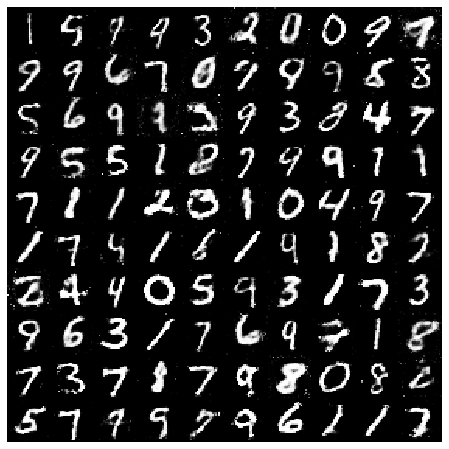

Epoch:   69
D Loss:  0.5920537710189819
G Loss:  0.847913384437561
Epoch:   70
D Loss:  0.5711690187454224
G Loss:  1.1718456745147705


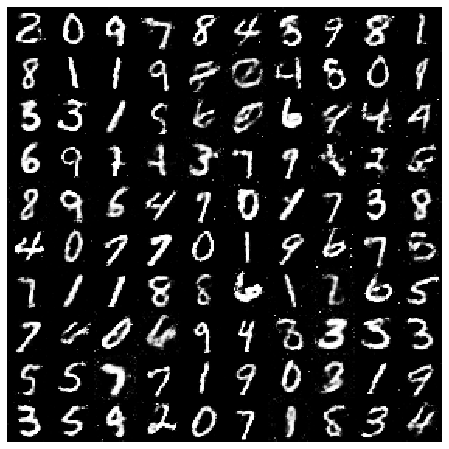

Epoch:   71
D Loss:  0.6098833680152893
G Loss:  0.8175088763237
Epoch:   72
D Loss:  0.5956634283065796
G Loss:  0.9091858863830566


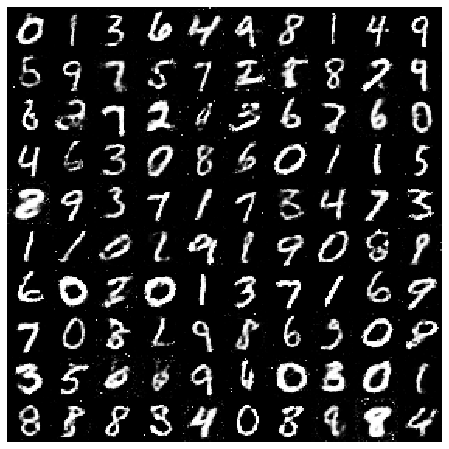

Epoch:   73
D Loss:  0.6379070281982422
G Loss:  1.2168750762939453
Epoch:   74
D Loss:  0.6229783296585083
G Loss:  1.091532826423645


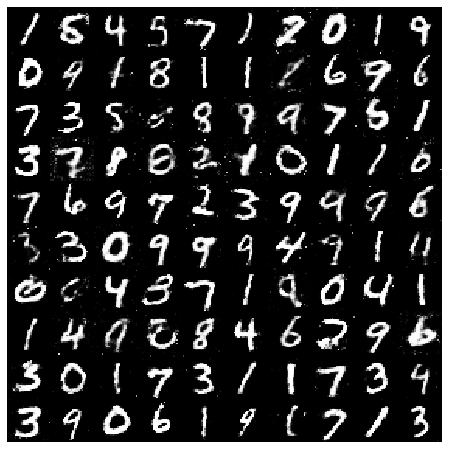

Epoch:   75
D Loss:  0.603782057762146
G Loss:  0.9175382852554321
Epoch:   76
D Loss:  0.619492769241333
G Loss:  1.1897861957550049


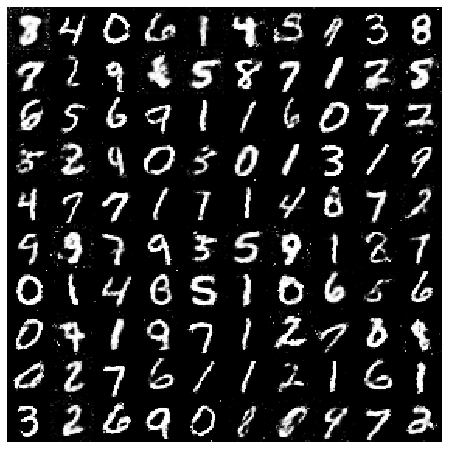

Epoch:   77
D Loss:  0.6126256585121155
G Loss:  0.973577082157135
Epoch:   78
D Loss:  0.6119836568832397
G Loss:  0.8186907768249512


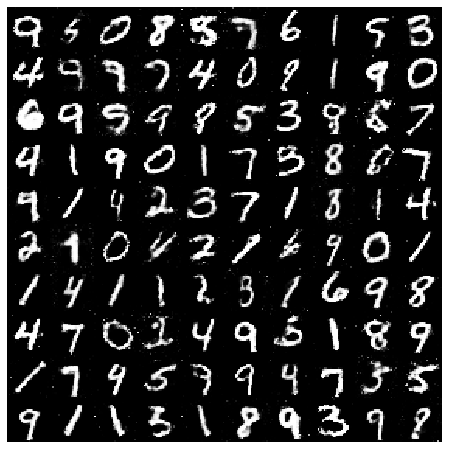

Epoch:   79
D Loss:  0.5963587760925293
G Loss:  1.0643181800842285
Epoch:   80
D Loss:  0.6136527061462402
G Loss:  1.252729892730713


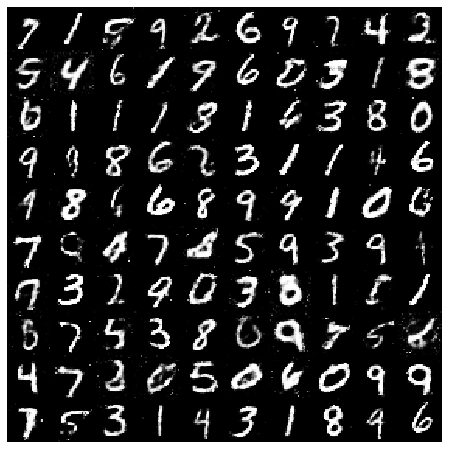

Epoch:   81
D Loss:  0.6277478933334351
G Loss:  0.6884351372718811
Epoch:   82
D Loss:  0.7224590182304382
G Loss:  1.4533158540725708


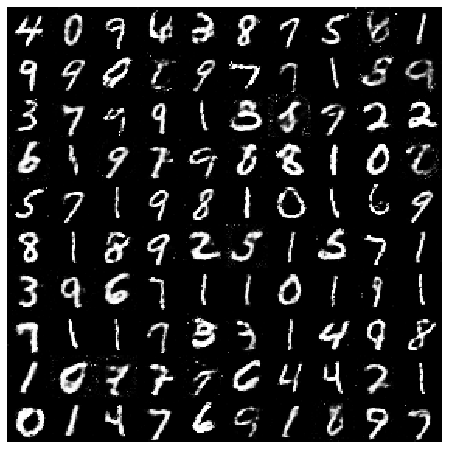

Epoch:   83
D Loss:  0.6249586939811707
G Loss:  1.2287206649780273
Epoch:   84
D Loss:  0.5835062861442566
G Loss:  1.1875309944152832


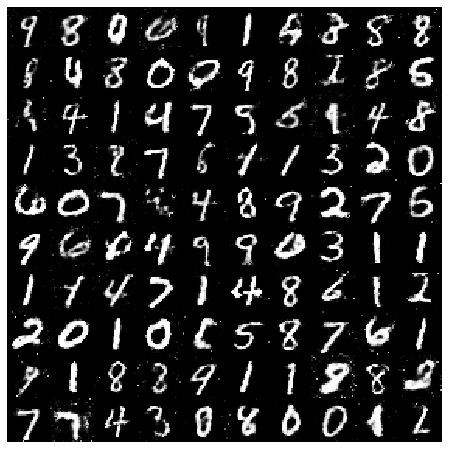

Epoch:   85
D Loss:  0.6131727695465088
G Loss:  1.0574946403503418
Epoch:   86
D Loss:  0.5962389707565308
G Loss:  0.900451123714447


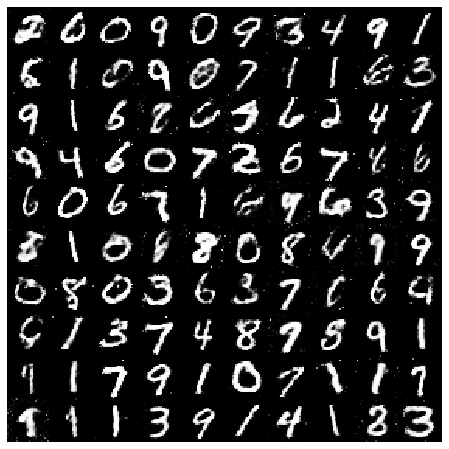

Epoch:   87
D Loss:  0.6075807809829712
G Loss:  0.7987959980964661
Epoch:   88
D Loss:  0.6033024191856384
G Loss:  0.8653411269187927


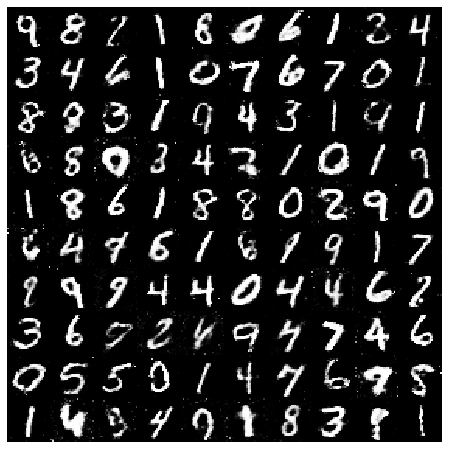

Epoch:   89
D Loss:  0.5998311638832092
G Loss:  1.0820348262786865
Epoch:   90
D Loss:  0.598037600517273
G Loss:  1.0523587465286255


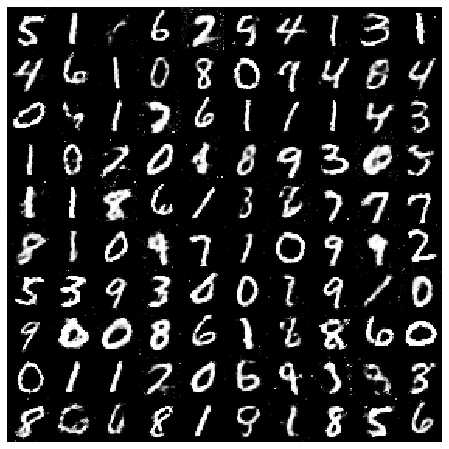

Epoch:   91
D Loss:  0.5848575234413147
G Loss:  1.0624973773956299
Epoch:   92
D Loss:  0.5880379676818848
G Loss:  0.9799751043319702


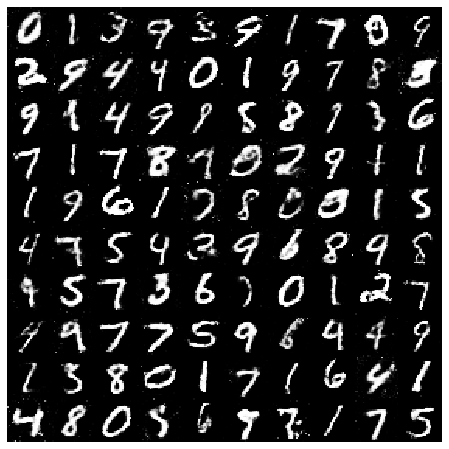

Epoch:   93
D Loss:  0.5941503047943115
G Loss:  0.9784440994262695
Epoch:   94
D Loss:  0.6412968039512634
G Loss:  0.6193898916244507


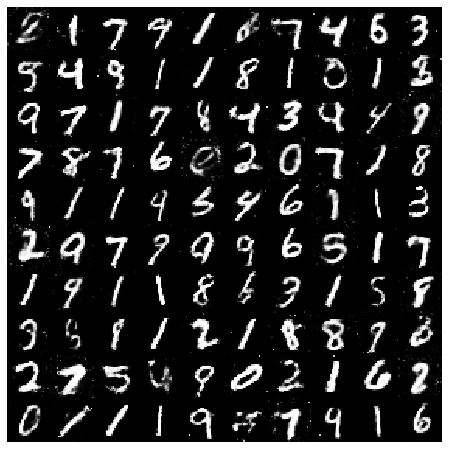

Epoch:   95
D Loss:  0.6183606386184692
G Loss:  1.007206916809082
Epoch:   96
D Loss:  0.6101723909378052
G Loss:  0.8140084743499756


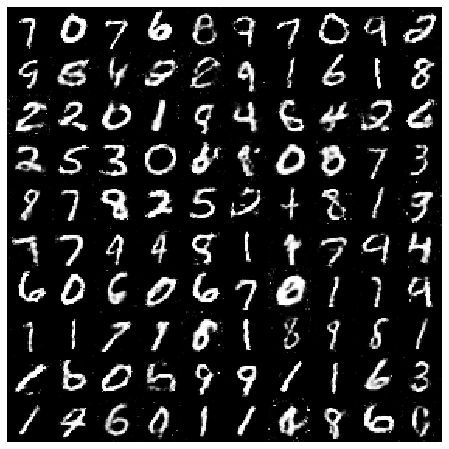

Epoch:   97
D Loss:  0.6195970773696899
G Loss:  0.8448387980461121
Epoch:   98
D Loss:  0.6159223318099976
G Loss:  0.7930859923362732


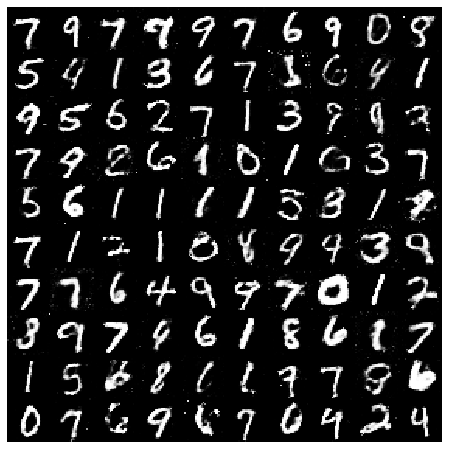

Epoch:   99
D Loss:  0.5976601839065552
G Loss:  1.0204906463623047
Epoch:   100
D Loss:  0.5935657024383545
G Loss:  0.8517796993255615


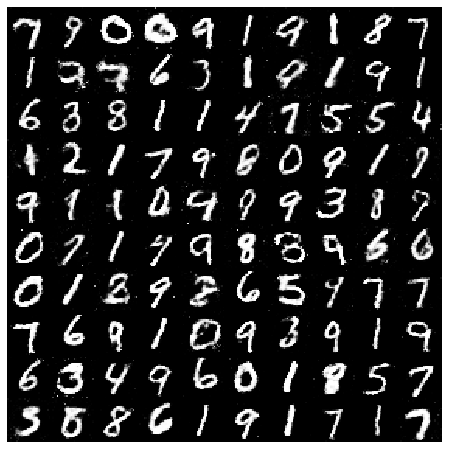

Epoch:   101
D Loss:  0.6133129596710205
G Loss:  1.0788449048995972
Epoch:   102
D Loss:  0.6064393520355225
G Loss:  1.0015650987625122


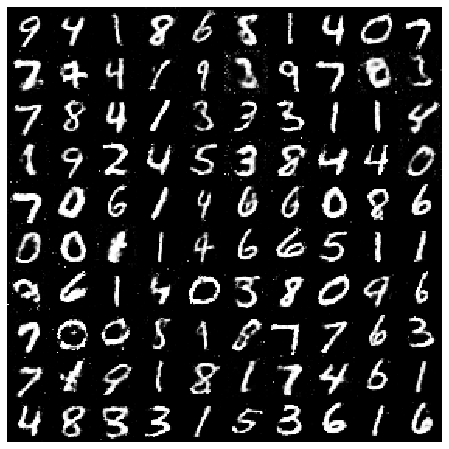

Epoch:   103
D Loss:  0.598800539970398
G Loss:  0.8212894201278687
Epoch:   104
D Loss:  0.6390224695205688
G Loss:  1.130486249923706


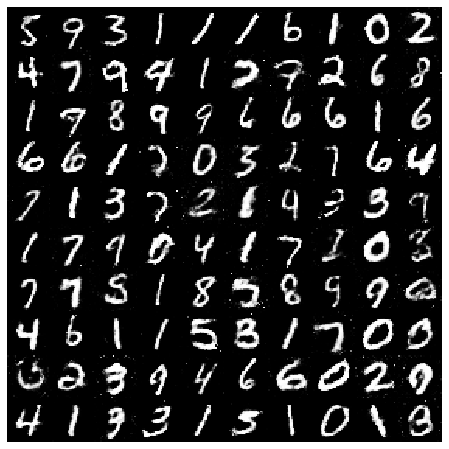

Epoch:   105
D Loss:  0.5762524604797363
G Loss:  0.955517053604126
Epoch:   106
D Loss:  0.604365348815918
G Loss:  0.9197394847869873


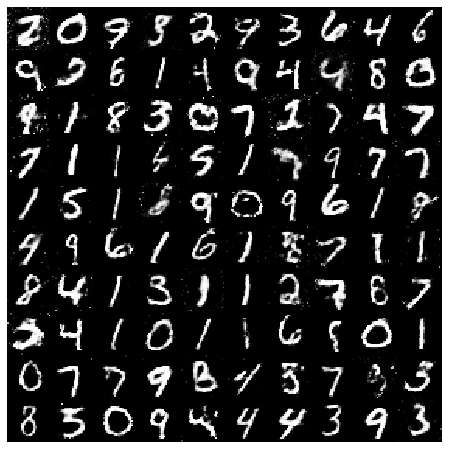

Epoch:   107
D Loss:  0.6044379472732544
G Loss:  1.0660183429718018
Epoch:   108
D Loss:  0.6290923357009888
G Loss:  0.8089563846588135


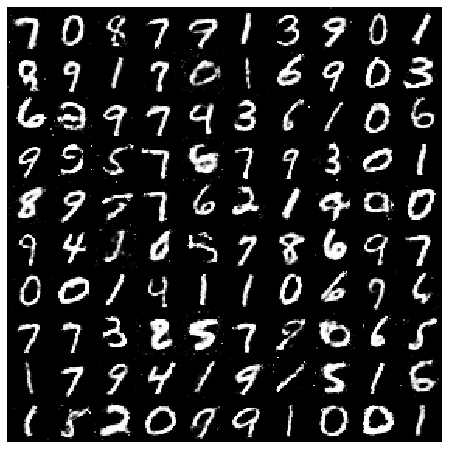

Epoch:   109
D Loss:  0.6031383275985718
G Loss:  1.2671667337417603
Epoch:   110
D Loss:  0.5908476114273071
G Loss:  1.1176958084106445


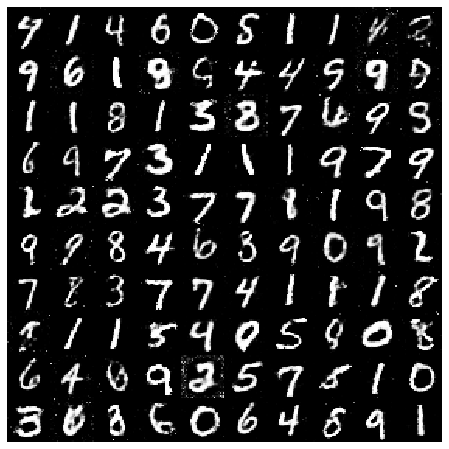

Epoch:   111
D Loss:  0.601589560508728
G Loss:  1.1422369480133057
Epoch:   112
D Loss:  0.6237038969993591
G Loss:  1.1427011489868164


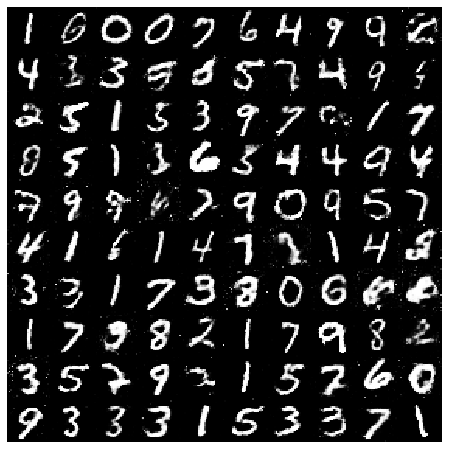

Epoch:   113
D Loss:  0.601405918598175
G Loss:  1.053804874420166
Epoch:   114
D Loss:  0.6050610542297363
G Loss:  0.8546484708786011


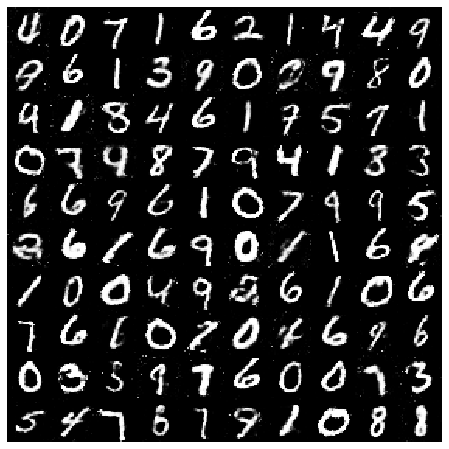

Epoch:   115
D Loss:  0.6040425896644592
G Loss:  1.046877145767212
Epoch:   116
D Loss:  0.5814290046691895
G Loss:  1.014500379562378


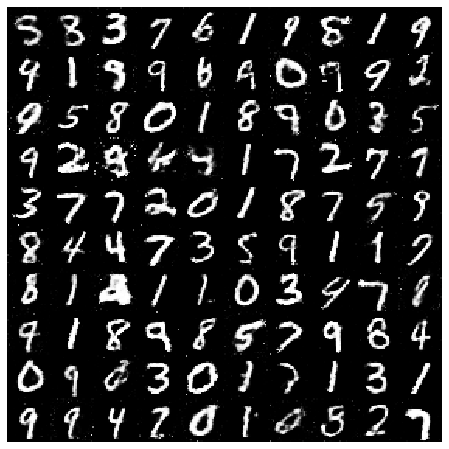

Epoch:   117
D Loss:  0.6097620725631714
G Loss:  0.961073100566864
Epoch:   118
D Loss:  0.6066513657569885
G Loss:  0.9899769425392151


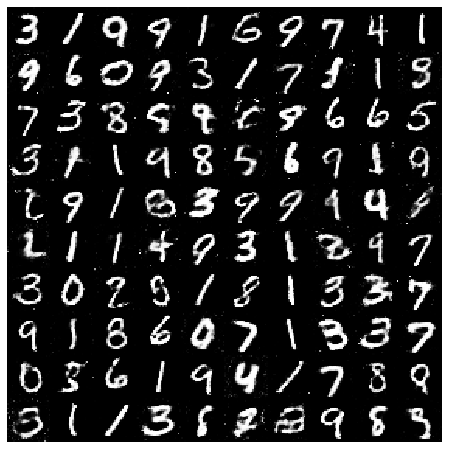

Epoch:   119
D Loss:  0.5945444107055664
G Loss:  0.7268442511558533
Epoch:   120
D Loss:  0.636932373046875
G Loss:  0.9936591982841492


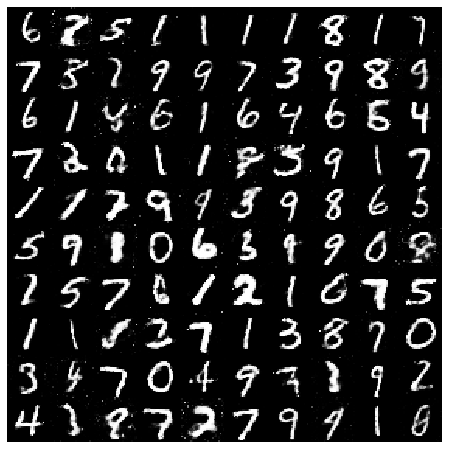

Epoch:   121
D Loss:  0.5937529802322388
G Loss:  0.8706815242767334
Epoch:   122
D Loss:  0.6167858839035034
G Loss:  1.2008163928985596


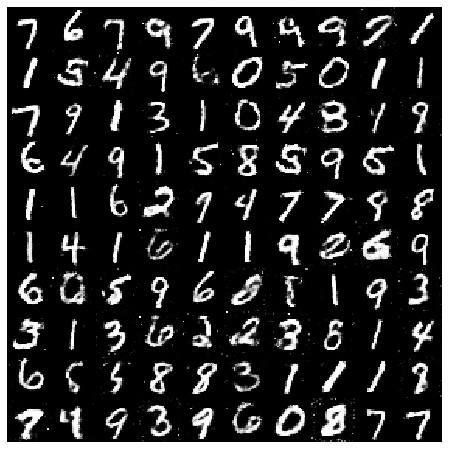

Epoch:   123
D Loss:  0.611260712146759
G Loss:  1.0222523212432861
Epoch:   124
D Loss:  0.5991576313972473
G Loss:  0.9880079030990601


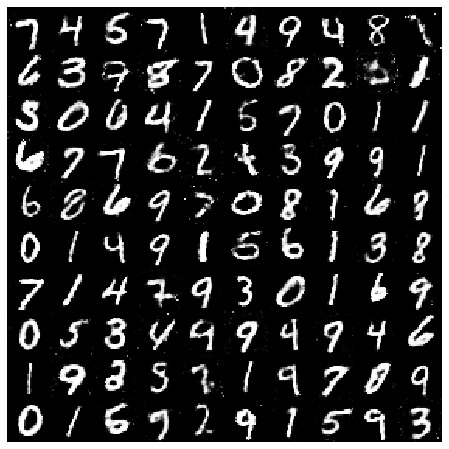

Epoch:   125
D Loss:  0.59486323595047
G Loss:  0.8520858287811279
Epoch:   126
D Loss:  0.6375668048858643
G Loss:  0.5988249778747559


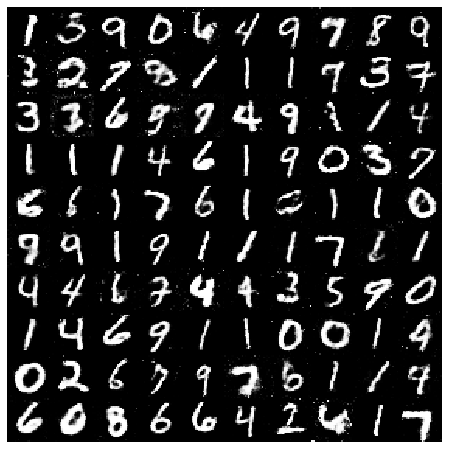

Epoch:   127
D Loss:  0.6071196794509888
G Loss:  1.2707093954086304
Epoch:   128
D Loss:  0.6172831654548645
G Loss:  1.061327338218689


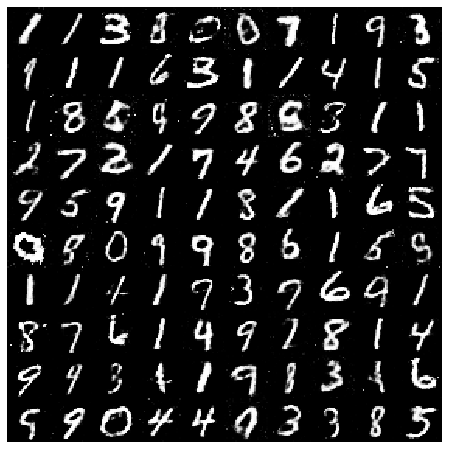

Epoch:   129
D Loss:  0.5949727296829224
G Loss:  0.9444153308868408
Epoch:   130
D Loss:  0.5960495471954346
G Loss:  0.8955528736114502


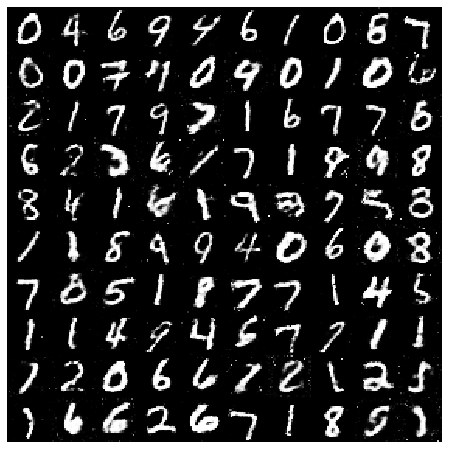

Epoch:   131
D Loss:  0.5842258930206299
G Loss:  0.8638502359390259
Epoch:   132
D Loss:  0.5986615419387817
G Loss:  1.0157661437988281


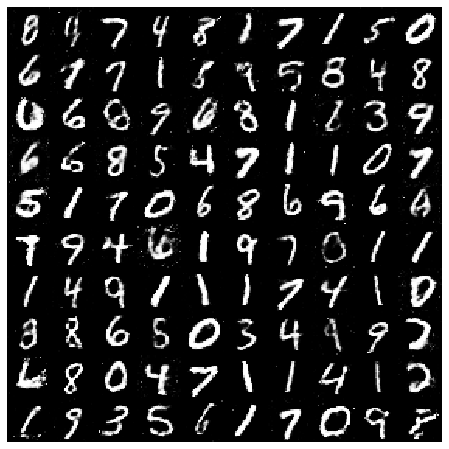

Epoch:   133
D Loss:  0.5960522890090942
G Loss:  1.2119405269622803
Epoch:   134
D Loss:  0.5995082259178162
G Loss:  0.9512565732002258


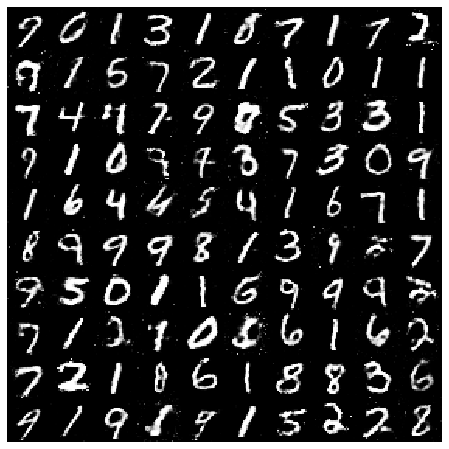

Epoch:   135
D Loss:  0.5879638195037842
G Loss:  0.9554163813591003
Epoch:   136
D Loss:  0.5910302400588989
G Loss:  0.8834154605865479


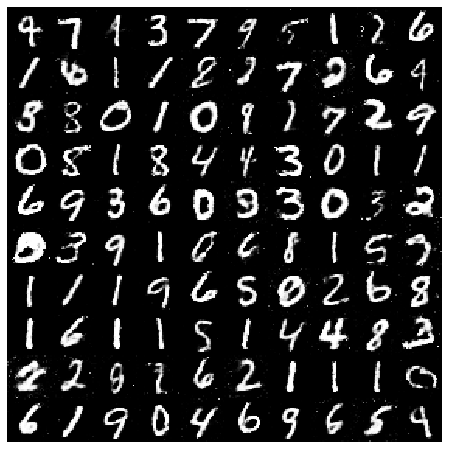

Epoch:   137
D Loss:  0.5898647904396057
G Loss:  0.9202070832252502
Epoch:   138
D Loss:  0.6732640266418457
G Loss:  1.4617741107940674


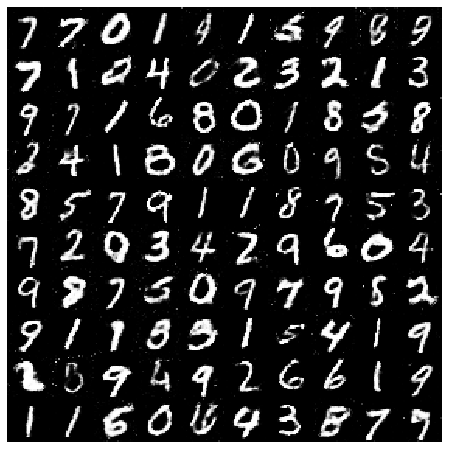

Epoch:   139
D Loss:  0.6217489242553711
G Loss:  0.8274064064025879
Epoch:   140
D Loss:  0.6012649536132812
G Loss:  1.2306675910949707


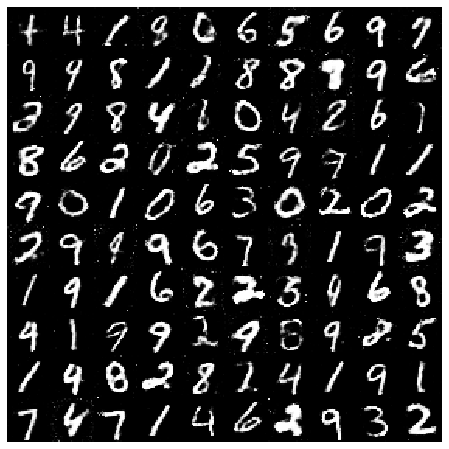

Epoch:   141
D Loss:  0.6158300638198853
G Loss:  1.2875311374664307
Epoch:   142
D Loss:  0.6266564130783081
G Loss:  1.2609527111053467


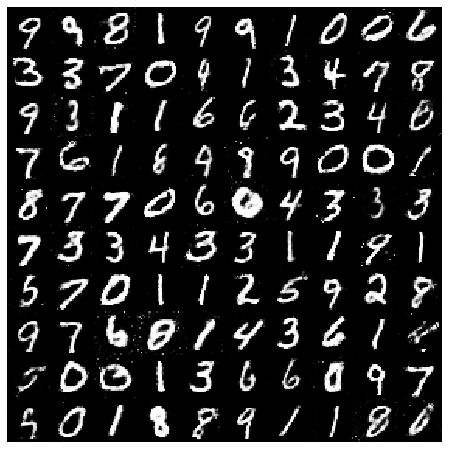

Epoch:   143
D Loss:  0.5865433812141418
G Loss:  1.385479211807251
Epoch:   144
D Loss:  0.6155174970626831
G Loss:  0.8277261257171631


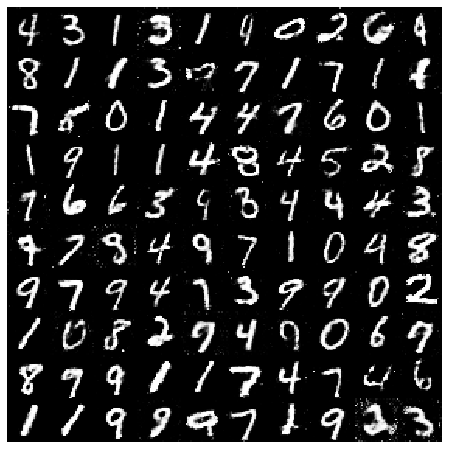

Epoch:   145
D Loss:  0.6334770917892456
G Loss:  0.7693415880203247
Epoch:   146
D Loss:  0.6061310768127441
G Loss:  1.005797028541565


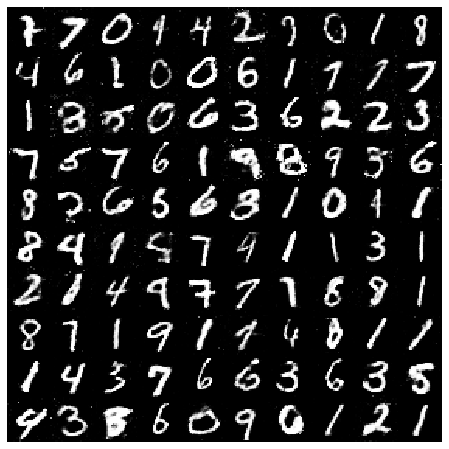

Epoch:   147
D Loss:  0.594842255115509
G Loss:  0.9611425399780273
Epoch:   148
D Loss:  0.6150965690612793
G Loss:  0.9291243553161621


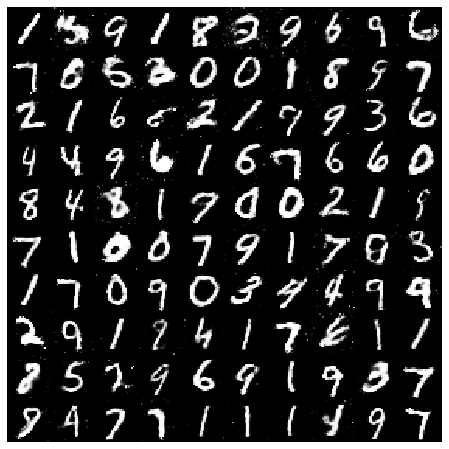

Epoch:   149
D Loss:  0.607154369354248
G Loss:  0.993425726890564
Epoch:   150
D Loss:  0.6002097129821777
G Loss:  0.9460192918777466


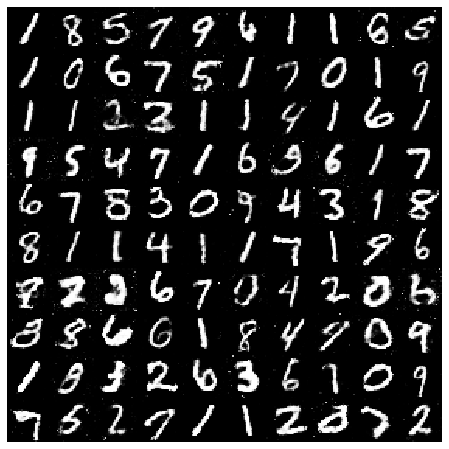

Epoch:   151
D Loss:  0.5841416716575623
G Loss:  0.9746260046958923
Epoch:   152
D Loss:  0.587769627571106
G Loss:  1.1099896430969238


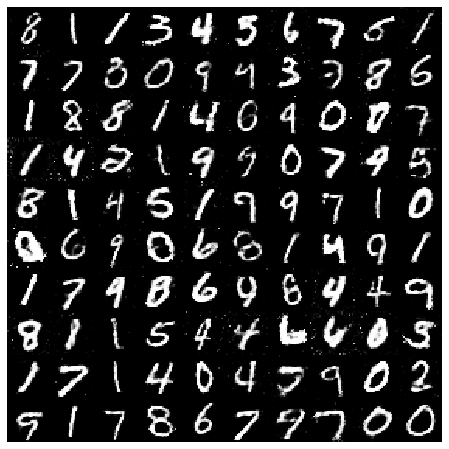

Epoch:   153
D Loss:  0.6108782291412354
G Loss:  1.0217514038085938
Epoch:   154
D Loss:  0.5894135236740112
G Loss:  0.8064463138580322


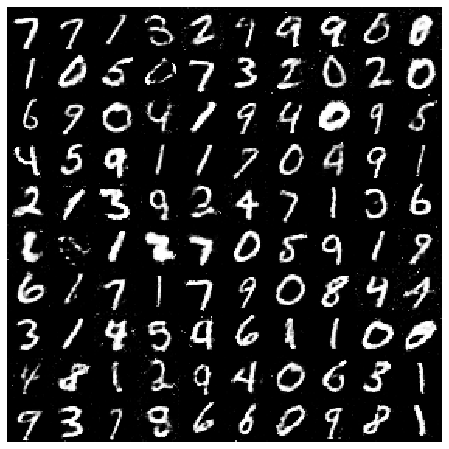

Epoch:   155
D Loss:  0.6007672548294067
G Loss:  0.973635196685791
Epoch:   156
D Loss:  0.6036356687545776
G Loss:  0.7931910753250122


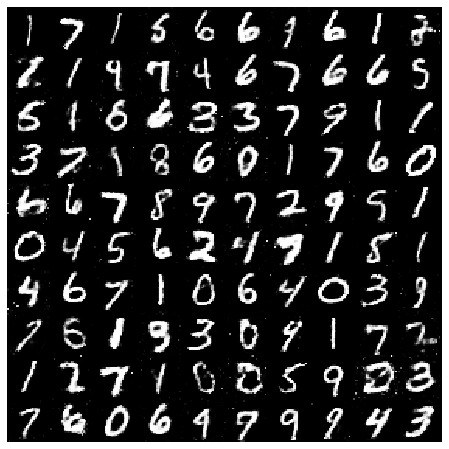

Epoch:   157
D Loss:  0.6360526084899902
G Loss:  0.7940629720687866
Epoch:   158
D Loss:  0.5915557146072388
G Loss:  1.0671718120574951


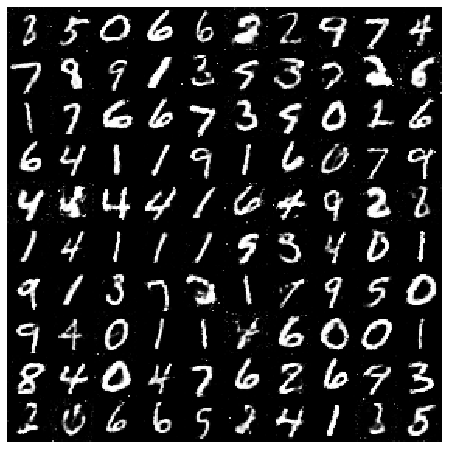

Epoch:   159
D Loss:  0.5908761024475098
G Loss:  1.05470609664917
Epoch:   160
D Loss:  0.6184283494949341
G Loss:  0.9158774614334106


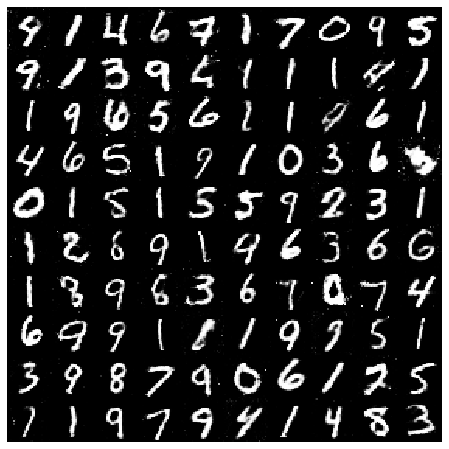

Epoch:   161
D Loss:  0.5882189273834229
G Loss:  1.0223743915557861
Epoch:   162
D Loss:  0.6155246496200562
G Loss:  0.9541205167770386


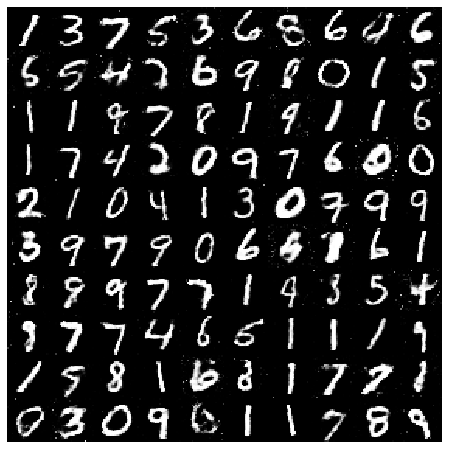

Epoch:   163
D Loss:  0.623805046081543
G Loss:  1.3210277557373047
Epoch:   164
D Loss:  0.6119879484176636
G Loss:  0.915421187877655


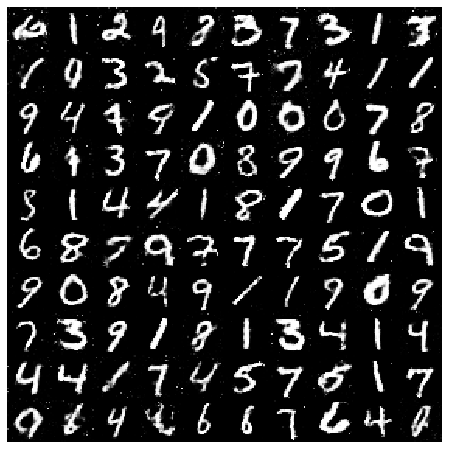

Epoch:   165
D Loss:  0.579071044921875
G Loss:  0.9574047923088074
Epoch:   166
D Loss:  0.5955814123153687
G Loss:  0.9670907258987427


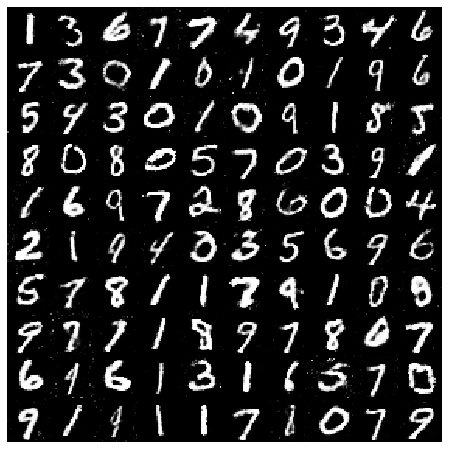

Epoch:   167
D Loss:  0.5737031698226929
G Loss:  1.2491018772125244
Epoch:   168
D Loss:  0.5971673727035522
G Loss:  1.1834931373596191


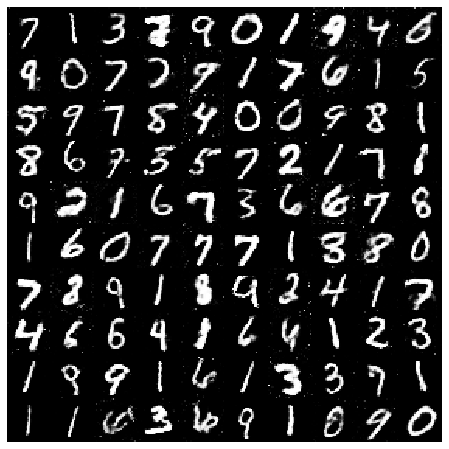

Epoch:   169
D Loss:  0.600909948348999
G Loss:  0.9273802042007446
Epoch:   170
D Loss:  0.5496156215667725
G Loss:  1.0555144548416138


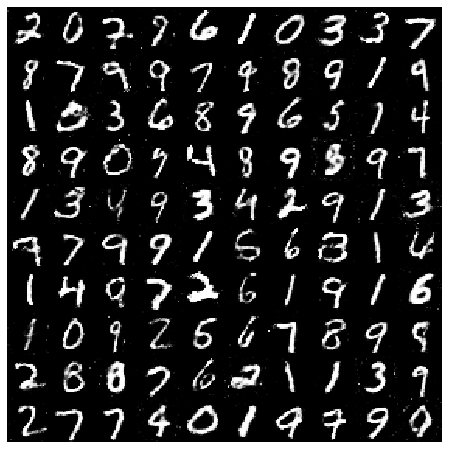

Epoch:   171
D Loss:  0.5766743421554565
G Loss:  1.0355803966522217
Epoch:   172
D Loss:  0.6154956221580505
G Loss:  0.9354698061943054


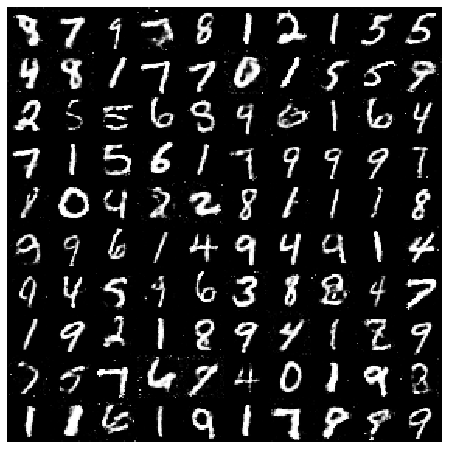

Epoch:   173
D Loss:  0.5665735602378845
G Loss:  1.0195283889770508
Epoch:   174
D Loss:  0.6122732162475586
G Loss:  0.822529137134552


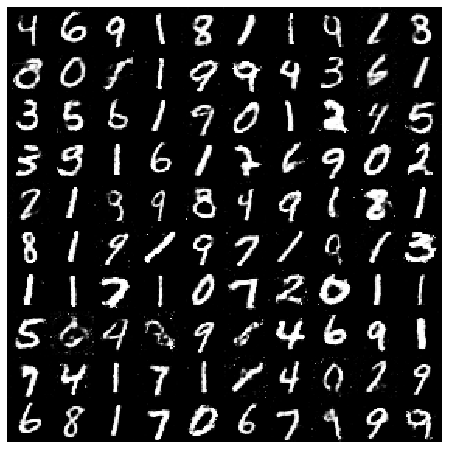

Epoch:   175
D Loss:  0.5807991027832031
G Loss:  1.0245121717453003
Epoch:   176
D Loss:  0.6111019849777222
G Loss:  1.1407086849212646


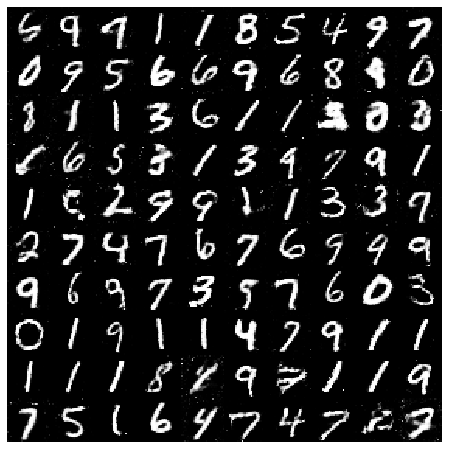

Epoch:   177
D Loss:  0.5877172350883484
G Loss:  0.9400389194488525
Epoch:   178
D Loss:  0.6054459810256958
G Loss:  1.0677554607391357


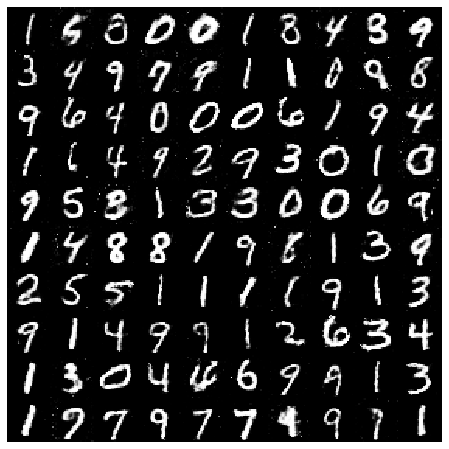

Epoch:   179
D Loss:  0.5771468877792358
G Loss:  0.9125709533691406
Epoch:   180
D Loss:  0.5961887836456299
G Loss:  0.8941180109977722


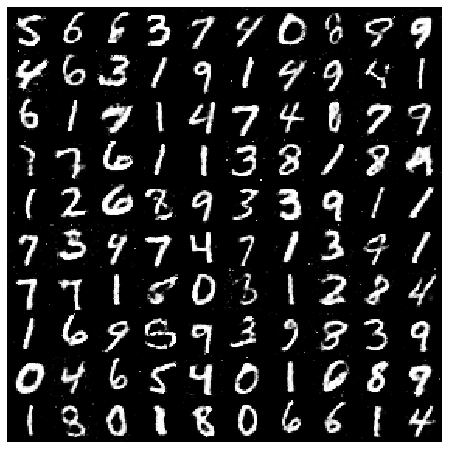

Epoch:   181
D Loss:  0.5970349907875061
G Loss:  1.1392987966537476
Epoch:   182
D Loss:  0.5792651772499084
G Loss:  0.9997119903564453


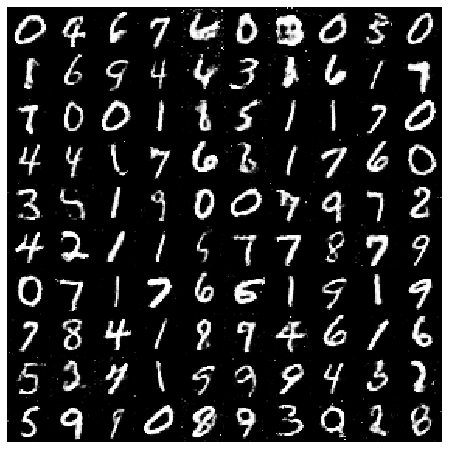

Epoch:   183
D Loss:  0.5760003328323364
G Loss:  1.0033016204833984
Epoch:   184
D Loss:  0.5809037685394287
G Loss:  0.9261168241500854


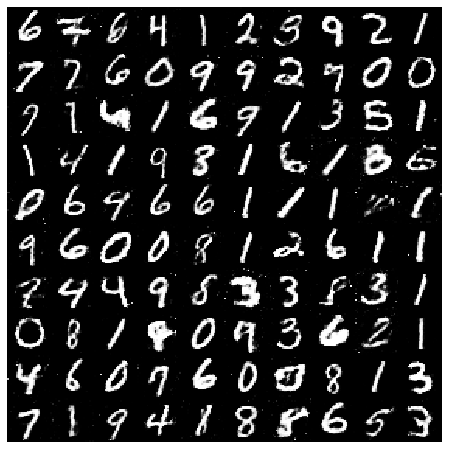

Epoch:   185
D Loss:  0.6126595735549927
G Loss:  1.0887566804885864
Epoch:   186
D Loss:  0.6012609004974365
G Loss:  1.260007381439209


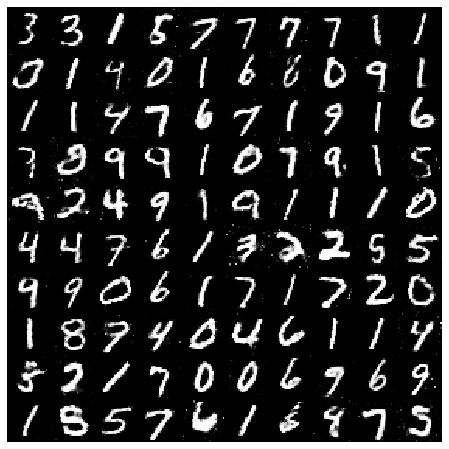

Epoch:   187
D Loss:  0.5938910245895386
G Loss:  0.988640308380127
Epoch:   188
D Loss:  0.5978674292564392
G Loss:  0.9646801352500916


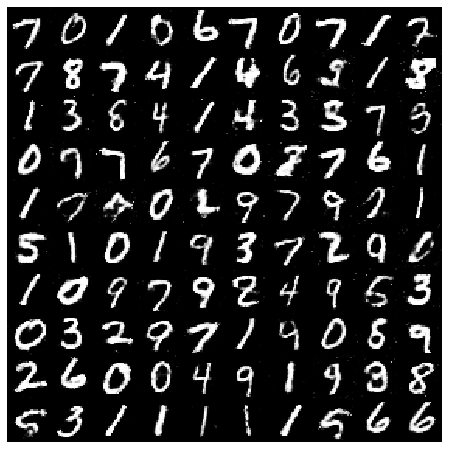

Epoch:   189
D Loss:  0.5967092514038086
G Loss:  1.0249226093292236
Epoch:   190
D Loss:  0.5726133584976196
G Loss:  1.1088939905166626


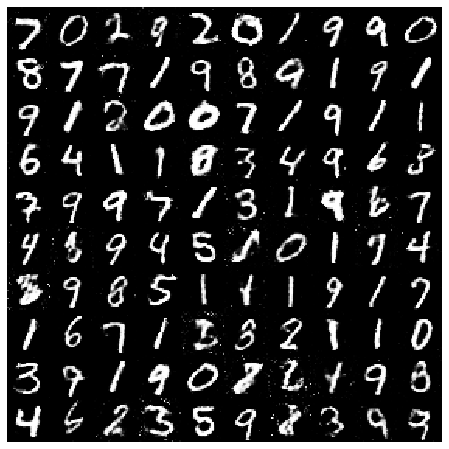

Epoch:   191
D Loss:  0.5822949409484863
G Loss:  0.9672062397003174
Epoch:   192
D Loss:  0.5794355869293213
G Loss:  0.9300006628036499


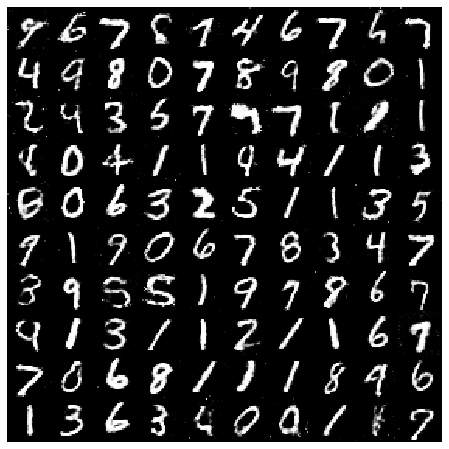

Epoch:   193
D Loss:  0.6191573143005371
G Loss:  0.8939929008483887
Epoch:   194
D Loss:  0.6111932992935181
G Loss:  1.0754762887954712


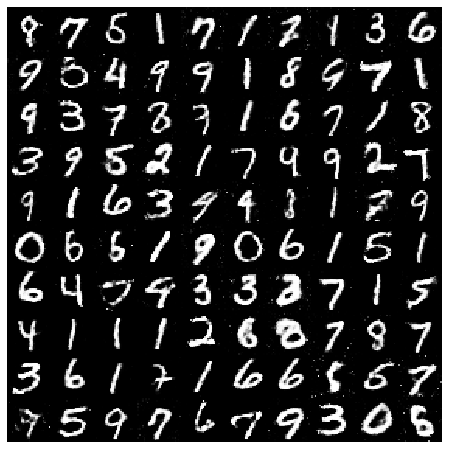

Epoch:   195
D Loss:  0.5913832187652588
G Loss:  1.0500119924545288
Epoch:   196
D Loss:  0.5984523296356201
G Loss:  1.0517396926879883


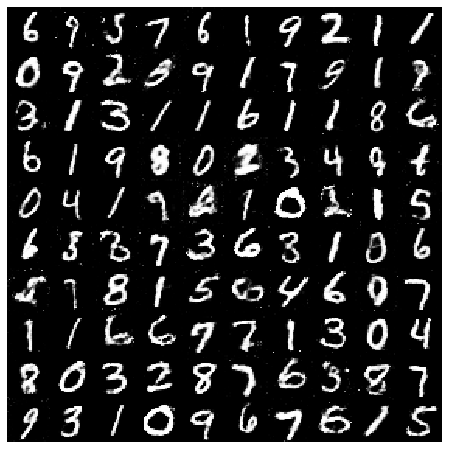

Epoch:   197
D Loss:  0.6007758378982544
G Loss:  0.889076292514801
Epoch:   198
D Loss:  0.5691019296646118
G Loss:  1.0315642356872559


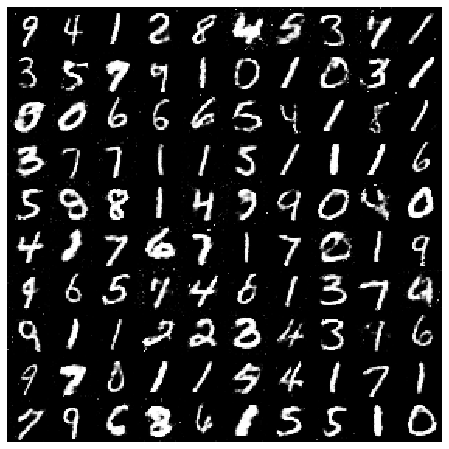

Epoch:   199
D Loss:  0.613307535648346
G Loss:  0.9842143654823303
Epoch:   200
D Loss:  0.6164087653160095
G Loss:  1.3317110538482666


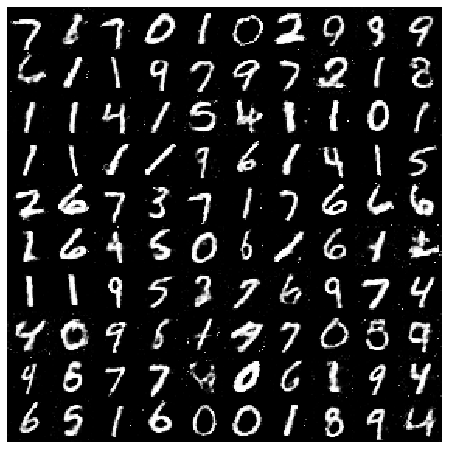

In [16]:
## Training loop

for epoch in range(epochs):
    for i, (images, _) in enumerate(train_loader):
        
        # We set targets_real and targets_fake to non-binary values(soft and noisy labels).
        # This is a hack for stable training of GAN's.  
        # GAN hacks: https://github.com/soumith/ganhacks#6-use-soft-and-noisy-labels
        
        targets_real = (torch.FloatTensor(images.size(0), 1).uniform_(0.8, 1.0))
        targets_fake = (torch.FloatTensor(images.size(0), 1).uniform_(0.0, 0.2))
                
        if is_cuda:
            targets_real = targets_real.cuda()
            targets_fake = targets_fake.cuda()
            images = images.cuda()
        
        ## D-STEP:
        ## First, clear the gradients of the Discriminator optimizer.
        ## Estimate logits_real by passing images through the Discriminator
        ## Generate fake_images by passing random noise through the Generator. Also, .detach() the fake images 
        ## as we don't compute the gradients of the Generator when optimizing Discriminator.
        ## fake_images = generator(noise(train_bs, noise_dim)).detach()
        ## Estimate logits_fake by passing the fake images through the Discriminator
        ## Compute the Discriminator loss by calling DLoss function.
        ## Compute the gradients by backpropagating through the computational graph. 
        ## Update the Discriminator parameters.
        optimizer_D.zero_grad()
        logits_real = discriminator(images) 
        fake_images = generator(noise(train_bs, noise_dim)).detach()
        logits_fake = discriminator(fake_images) 
        discriminator_loss = DLoss(logits_real, logits_fake, targets_real, targets_fake)
        discriminator_loss.backward()
        optimizer_D.step()

        ## G-STEP:
        ## clear the gradients of the Generator. 
        ## Generate fake images by passing random noise through the Generator. 
        ## Estimate logits_fake by passing the fake images through the Discriminator.
        ## compute the Generator loss by caling GLoss.
        ## compute the gradients by backpropagating through the computational graph.
        ## Update the Generator parameters.         
        # your code here
        optimizer_G.zero_grad()
        fake_images = generator(noise(train_bs, noise_dim))
        logits_fake = discriminator(fake_images)
        generator_loss = GLoss(logits_fake, targets_real)
        generator_loss.backward()
        optimizer_G.step()


    print("Epoch:  ", epoch)
    print("D Loss: ", discriminator_loss.item())
    print("G Loss: ", generator_loss.item())
          
    if epoch % 2 == 0:
        viz_batch = fake_images.data.cpu().numpy()
        viz_batch = viz_batch[:100,:,:,:]
        viz_batch = viz_batch.reshape(-1,28*28).squeeze()
        viz_batch = viz_batch.reshape(10,10, 28,28).transpose(0,2,1,3).reshape(28*10,-1)

        plt.figure(figsize = (8,8))
        plt.axis('off')
        plt.imshow(viz_batch, cmap='gray')
        plt.show()

#### The assignment is graded both manually and using auto-graded testcases.